In [1]:
import import_ipynb
from copy import deepcopy
import torch
from tape import TAPETokenizer
import pandas as pd
import numpy as np
import random
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from tqdm import trange

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from FineTuningProteinModelsonMyDatasets import PeptideClassificationModel

importing Jupyter notebook from FineTuningProteinModelsonMyDatasets.ipynb


FineTuningProteinModelsonMyDatasets.ipynb:2: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  "cells": [


Protein Sequence:  GCTVEDR

Encoded Input Length:  9

Encoded Input:  tensor([[ 2, 11,  7, 23, 25,  9,  8, 21,  3]])

Output Sequence Length:  torch.Size([1, 9, 768])

Pooled Output Size:  torch.Size([1, 768])

Output Sequence:  tensor([[[ 0.5911,  1.0075,  0.8251,  ...,  0.5309,  0.6056, -0.6089],
         [ 0.9178, -0.7448, -0.7677,  ...,  0.3638,  0.4572, -0.5632],
         [ 0.9718,  0.5218, -0.8213,  ...,  0.8715,  0.4985, -1.2027],
         ...,
         [ 0.0147, -0.7276, -1.7229,  ...,  0.6857, -0.6894, -1.2196],
         [-0.9114, -1.2325, -0.6967,  ...,  0.4279, -0.3354, -0.5608],
         [-0.5925,  0.2265, -0.6207,  ...,  0.6646, -0.7102, -0.3488]]],
       grad_fn=<AddBackward0>)

Pooled Output:  tensor([[-7.9848e-02, -6.5225e-01, -3.8316e-01, -4.3976e-01, -2.2729e-01,
         -2.8057e-01, -5.0535e-01, -2.0483e-01,  3.8906e-01,  6.7004e-01,
         -3.6246e-02,  1.1568e-02, -3.1143e-01,  3.2744e-01, -4.3844e-02,
          7.9236e-01, -7.8314e-01,  4.1429e-01, -7.2975e-01

tensor([[-0.0855, -0.0947]], device='cuda:0', grad_fn=<AddmmBackward0>)
[tensor([ 2, 28, 25, 12,  8, 17,  7,  3,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]), tensor([ 2, 19, 14, 19,  9, 19, 14, 19, 14,  3,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]), tensor([ 2, 14, 20, 15, 11, 21, 13, 16, 15,  3,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]), tensor([ 2,  5,  5, 15,  9,  5, 14, 13,  7,  3,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]), tensor([ 2,  5,  5, 11,  5, 25, 16, 21, 11, 10, 25, 10, 23,  3,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]), tensor([ 2,  5, 11, 21, 11, 21, 19, 11, 19, 11, 15,  3,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]), tensor([ 2, 12, 10, 12, 12, 19,  9, 23, 22, 21, 19,

Epoch:  33%|███▎      | 1/3 [00:10<00:20, 10.08s/it]


	 - Train loss: 0.7106
	 - Validation Accuracy: 0.5025


Epoch:  67%|██████▋   | 2/3 [00:20<00:10, 10.09s/it]


	 - Train loss: 0.6972
	 - Validation Accuracy: 0.5800


Epoch: 100%|██████████| 3/3 [00:30<00:00, 10.10s/it]



	 - Train loss: 0.6526
	 - Validation Accuracy: 0.5450


Epoch:  33%|███▎      | 1/3 [00:10<00:20, 10.14s/it]


	 - Train loss: 0.0840
	 - Validation Accuracy: 1.0000


Epoch:  67%|██████▋   | 2/3 [00:20<00:10, 10.14s/it]


	 - Train loss: 0.0142
	 - Validation Accuracy: 1.0000


Epoch: 100%|██████████| 3/3 [00:30<00:00, 10.14s/it]


	 - Train loss: 0.0112
	 - Validation Accuracy: 0.9978


Sequence:  KQLGRIML
Model 1 predicted:  tensor([-0.1525,  0.2374], device='cuda:0', grad_fn=<SelectBackward0>)
Model 2 predicted:  tensor([ 2.0204, -2.3793], device='cuda:0', grad_fn=<SelectBackward0>)
Sequence:  QQQQAPKL
Model 1 predicted:  tensor([-0.3430,  0.3712], device='cuda:0', grad_fn=<SelectBackward0>)
Model 2 predicted:  tensor([-3.3453,  2.3475], device='cuda:0', grad_fn=<SelectBackward0>)


In [3]:
tokenizer = TAPETokenizer(vocab='iupac') 

In [4]:
normal_model = PeptideClassificationModel()
normal_model.load_state_dict(torch.load("normal_model.pth"))
normal_model.to('cuda')

hans_model = PeptideClassificationModel()
hans_model.load_state_dict(torch.load("hans_model.pth"))
hans_model.to('cuda')

PeptideClassificationModel(
  (base_model): ProteinBertModel(
    (embeddings): ProteinBertEmbeddings(
      (word_embeddings): Embedding(30, 768, padding_idx=0)
      (position_embeddings): Embedding(8192, 768)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm()
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): ProteinBertEncoder(
      (layer): ModuleList(
        (0): ProteinBertLayer(
          (attention): ProteinBertAttention(
            (self): ProteinBertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): ProteinBertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm()
              (d

In [5]:
def print_layers_and_return_weights(model):
    parameters = deepcopy(model.state_dict())
    #print("Model's state_dict:")
    #for param_tensor in parameters:
        #print(param_tensor, "\t", parameters[param_tensor].size())
    #print()
    return parameters

In [6]:
normal_model_parameters = print_layers_and_return_weights(normal_model)
hans_model_parameters = print_layers_and_return_weights(hans_model)

In [7]:
normal_model_parameters["base_model.pooler.dense.weight"]

tensor([[ 0.0061, -0.0230, -0.0244,  ..., -0.0460, -0.0201,  0.0169],
        [-0.0293,  0.0142,  0.0028,  ...,  0.0102,  0.0015, -0.0162],
        [ 0.0022,  0.0004,  0.0066,  ...,  0.0045, -0.0196,  0.0189],
        ...,
        [-0.0163,  0.0121, -0.0266,  ...,  0.0082, -0.0237,  0.0111],
        [ 0.0001, -0.0029,  0.0327,  ..., -0.0013,  0.0182, -0.0056],
        [ 0.0214, -0.0530, -0.0378,  ..., -0.0182, -0.0025,  0.0179]],
       device='cuda:0')

### Check Out The Pooler Weights

In [10]:
#normal_pooler_weights = normal_model_parameters["base_model.pooler.dense.weight"].cpu().numpy()
#sns.set(rc={'figure.figsize':(200,200)})
#sns.heatmap(normal_pooler_weights, cmap = "inferno")

In [11]:
#hans_pooler_weights = hans_model_parameters["base_model.pooler.dense.weight"].cpu().numpy()
#sns.set(rc={'figure.figsize':(200,200)})
#sns.heatmap(hans_pooler_weights, cmap = "inferno")

### Check Out Predictions

In [10]:
def compare_models_predictions(sequence, model1, model2):
    token_ids = torch.tensor([tokenizer.encode(sequence)]).to("cuda")
    output1 = model1(token_ids)[0]
    output2 = model2(token_ids)[0]
    print("Sequence: ", sequence)
    print("Model 1 predicted: ", output1)
    print("Model 2 predicted: ", output2)

In [11]:
compare_models_predictions("QQQQKQLGRIML", normal_model, hans_model)

Sequence:  QQQQKQLGRIML
Model 1 predicted:  tensor([-0.1118,  0.0368], device='cuda:0', grad_fn=<SelectBackward0>)
Model 2 predicted:  tensor([-2.0876,  2.8034], device='cuda:0', grad_fn=<SelectBackward0>)


### Check Out the 12 Self-Attention Weights

In [12]:
token_ids = torch.tensor([tokenizer.encode("QQKPAAK")]).to("cuda")
normal_attentions = normal_model.base_model(token_ids)[-1]
hans_attentions = hans_model.base_model(token_ids)[-1]

In [13]:
normal_attentions

(tensor([[[[3.3241e-03, 2.7574e-01, 1.1363e-01, 5.6907e-02, 2.8079e-02,
            2.2737e-01, 1.4474e-01, 4.8316e-02, 1.0190e-01],
           [2.9313e-01, 5.6084e-02, 6.4541e-02, 8.7603e-02, 1.9439e-01,
            4.9343e-02, 1.1803e-01, 7.7428e-02, 5.9459e-02],
           [2.4348e-01, 1.0724e-01, 9.1536e-02, 1.4210e-01, 1.3205e-01,
            5.2227e-02, 8.2179e-02, 8.1900e-02, 6.7297e-02],
           [2.2069e-01, 1.1151e-01, 9.0005e-02, 9.7270e-02, 2.2009e-01,
            3.4747e-02, 8.0918e-02, 7.1956e-02, 7.2812e-02],
           [3.0693e-01, 5.5456e-02, 7.3956e-02, 1.2892e-01, 1.0688e-01,
            6.1720e-02, 9.7326e-02, 7.8920e-02, 8.9891e-02],
           [2.6659e-01, 6.6373e-02, 6.1509e-02, 1.3978e-01, 1.5317e-01,
            4.0727e-02, 9.6222e-02, 1.0770e-01, 6.7930e-02],
           [2.0017e-01, 7.2529e-02, 1.3021e-01, 1.0952e-01, 1.2744e-01,
            5.9335e-02, 9.1546e-02, 1.2933e-01, 7.9923e-02],
           [2.4112e-01, 7.5677e-02, 1.0347e-01, 1.2401e-01, 7.6864e-0

In [14]:
from transformers import AutoTokenizer, AutoModel, utils
from bertviz import model_view
utils.logging.set_verbosity_error() 

In [15]:
token_ids = torch.tensor([tokenizer.encode("QQQQKPAAK")]).to("cuda")
outputs = hans_model.base_model(token_ids)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(token_ids[0])
model_view(attention, tokens)  # Display model view

<IPython.core.display.Javascript object>

In [16]:
token_ids = torch.tensor([tokenizer.encode("QQQQKPAAK")]).to("cuda")
outputs = normal_model.base_model(token_ids)
attention = outputs[-1]
tokens = tokenizer.convert_ids_to_tokens(token_ids[0])
model_view(attention, tokens)  # Display model view

<IPython.core.display.Javascript object>

### But we want to print matrix heatmaps, not with Bertviz

In [33]:
token_ids = torch.tensor([tokenizer.encode("QQQQKPS")]).to("cuda")
outputs = normal_model.base_model(token_ids)
attention = outputs[-1]

Attention Output size: (layers, batch_size, num_attention_heads, sequence_length, sequence_length)

In this exact case: *(12,1,12,10,10)*

In [34]:
attention[0][0][1]

tensor([[9.6590e-02, 1.8738e-01, 9.8475e-02, 3.9973e-02, 1.3437e-01, 1.5871e-01,
         1.0746e-01, 7.1388e-02, 5.9468e-02, 4.6188e-02],
        [5.0788e-01, 2.7820e-01, 3.4578e-02, 3.2273e-02, 3.1406e-02, 4.1126e-02,
         1.9823e-02, 1.1977e-02, 1.4690e-02, 2.8048e-02],
        [4.5659e-01, 1.3235e-01, 5.5662e-02, 9.2379e-02, 3.0497e-02, 3.9986e-02,
         5.6641e-02, 3.1537e-02, 3.9186e-02, 6.5170e-02],
        [1.7346e-01, 6.4635e-01, 3.4847e-02, 2.7202e-02, 2.5204e-02, 2.5373e-02,
         1.5780e-02, 7.7438e-03, 2.0128e-02, 2.3914e-02],
        [9.0051e-02, 8.7586e-01, 6.6967e-03, 4.0289e-03, 4.5188e-03, 6.1913e-03,
         2.9763e-03, 1.2656e-03, 4.8597e-03, 3.5551e-03],
        [2.8325e-02, 9.6264e-01, 2.1121e-03, 1.4234e-03, 9.1664e-04, 1.0651e-03,
         1.0533e-03, 3.4949e-04, 1.2171e-03, 8.9863e-04],
        [3.6557e-01, 3.5870e-01, 3.6578e-02, 3.1249e-02, 2.8449e-02, 5.5446e-02,
         3.5651e-02, 1.4074e-02, 2.6894e-02, 4.7388e-02],
        [1.5409e-01, 6.4824

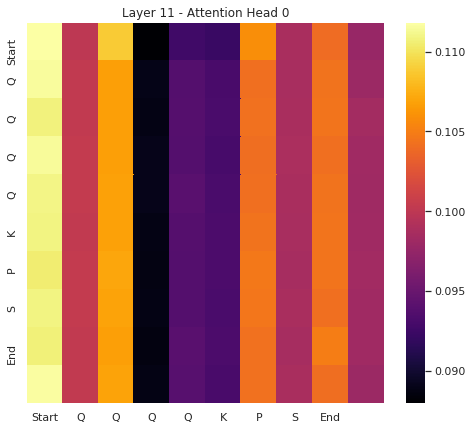

In [47]:
sns.set(rc={'figure.figsize':(8,7)})
plt.title("Layer 11 - Attention Head 0")
sns.heatmap(attention[11][0][0].detach().cpu().numpy(), cmap = "inferno", 
            yticklabels=["Start","Q","Q","Q","Q","K","P","S","End"],
            xticklabels=["Start","Q","Q","Q","Q","K","P","S","End"])

In [20]:
def visualize_self_attentions(model, sequence, layer):
    token_ids = torch.tensor([tokenizer.encode(sequence)]).to("cuda")
    outputs = model.base_model(token_ids)
    attention = outputs[-1]

    fig, axes = plt.subplots(4, 3, figsize=(30, 30))

    fig.suptitle("Self-Attention for each Head")
    
    seq_symbols = [symbol for symbol in sequence]
    seq_symbols.append("End")
    seq_symbols = ["Start"] + seq_symbols
    
    
    sns.heatmap(ax=axes[0, 0], data=attention[11][0][0].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[0, 1], data=attention[11][0][1].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[0, 2], data=attention[11][0][2].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[1, 0], data=attention[11][0][3].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[1, 1], data=attention[11][0][4].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[1, 2], data=attention[11][0][5].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[2, 0], data=attention[11][0][6].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[2, 1], data=attention[11][0][7].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[2, 2], data=attention[11][0][8].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[3, 0], data=attention[11][0][9].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[3, 1], data=attention[11][0][10].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)
    sns.heatmap(ax=axes[3, 2], data=attention[11][0][11].detach().cpu().numpy(), cmap = "inferno",
                yticklabels=seq_symbols,xticklabels=seq_symbols)

    axes[0, 0].set_title("Head: 0")
    axes[0, 1].set_title("Head: 1")
    axes[0, 2].set_title("Head: 2")
    axes[1, 0].set_title("Head: 3")
    axes[1, 1].set_title("Head: 4")
    axes[1, 2].set_title("Head: 5")
    axes[2, 0].set_title("Head: 6")
    axes[2, 1].set_title("Head: 7")
    axes[2, 2].set_title("Head: 8")
    axes[3, 0].set_title("Head: 9")
    axes[3, 1].set_title("Head: 10")
    axes[3, 2].set_title("Head: 11")

### With Hans QQQQ

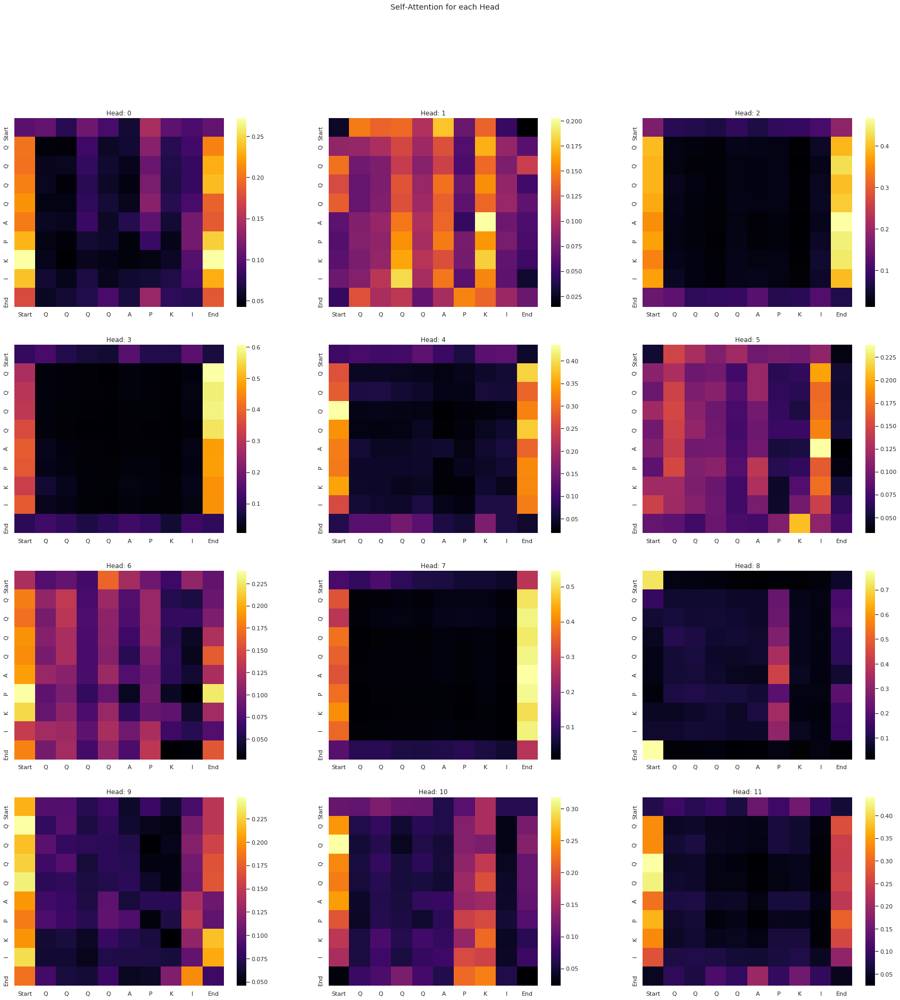

In [48]:
visualize_self_attentions(normal_model, "QQQQAPKI", 11)

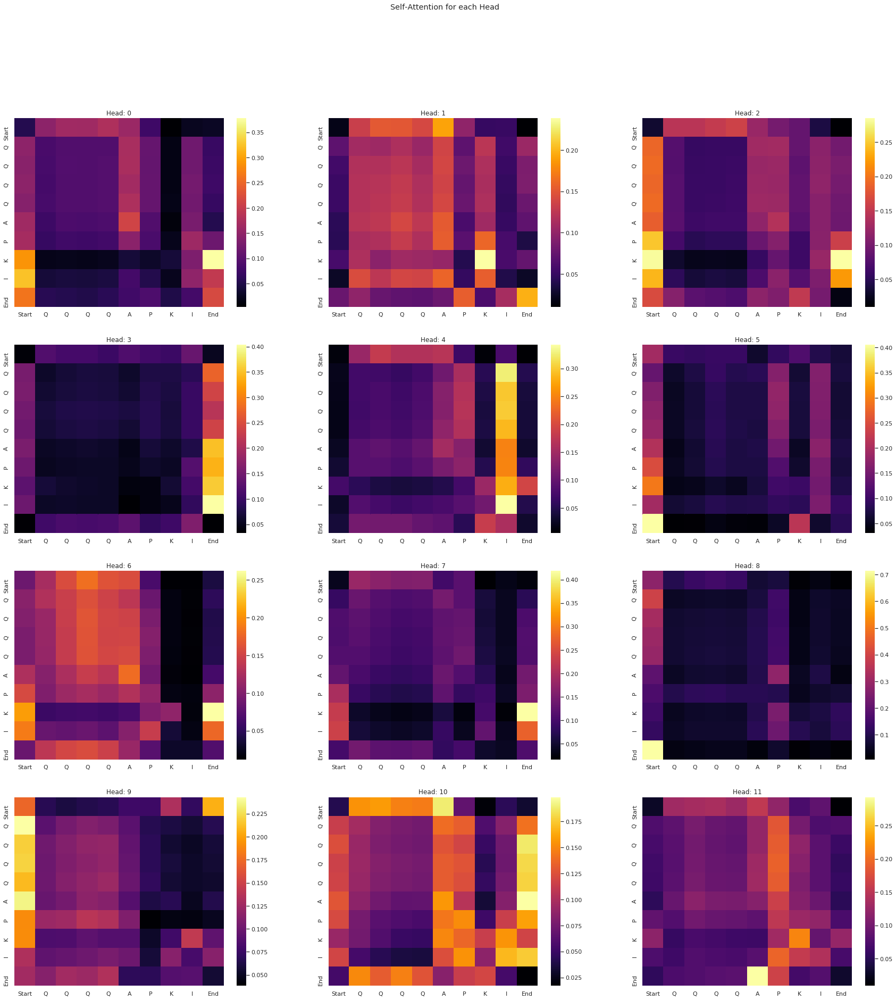

In [49]:
visualize_self_attentions(hans_model, "QQQQAPKI", 11)

### Without Hans

In [ ]:
visualize_self_attentions(normal_model, "DGTYR", 11)

In [ ]:
visualize_self_attentions(hans_model, "DGTYR", 11)